# Validação visual: elipse vs faixa (band)

Compara, para cada região/combinação:
- **original**
- **elipse** (união das elipses unitárias)
- **faixa band** (unitária ou união das unitárias; híbrido = retângulos + elipse na boca)

`full` band foi descartado. Reutiliza `models/face_detector.py` e `models/masks.py`.

In [11]:
import sys
from pathlib import Path

ROOT = Path.cwd().resolve()
if ROOT.name == "notebooks":
    ROOT = ROOT.parent
if str(ROOT) not in sys.path:
    sys.path.insert(0, str(ROOT))

DATA_DIR = Path("/mnt/study-data/dcarvalho/datasets/celebahq_pp")
OUTPUT_DIR = Path("/mnt/study-data/dcarvalho/tests/mask_bands_view_3")
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

IMAGE_SIZE = 224
NUM_SAMPLES = 6
CTX_ID = -1

# (label, ellipse_regions_spec, band_regions_spec)
COMPARISONS = [
    ("eyes", "eyes", "eyes"),
    ("nose", "nose", "nose"),
    ("mouth", "mouth", "mouth"),
    ("eyes-nose", "eyes,nose", "eyes-nose"),
    ("eyes-mouth", "eyes,mouth", "eyes-mouth"),
    ("nose-mouth", "nose,mouth", "nose-mouth"),
    ("eyes-nose-mouth", "eyes,nose,mouth", "eyes-nose-mouth"),
    ("hybrid", "eyes,nose,mouth", "eyes-nose-mouth-hybrid"),
]

print(f"Project root: {ROOT}")
print(f"Output dir: {OUTPUT_DIR}")

Project root: /home/dcarvalho/Lightweight-Face-De-identification
Output dir: /mnt/study-data/dcarvalho/tests/mask_bands_view_3


In [12]:
import importlib
import cv2
import matplotlib.pyplot as plt
import numpy as np
import torch

import models.masks as masks_mod
importlib.reload(masks_mod)

from models.face_detector import FaceDetector, _to_bgr_uint8
from models.masks import build_band_region_mask, build_region_mask, parse_mask_regions

device = torch.device("cpu")
detector = FaceDetector(ctx_id=CTX_ID)


def load_rgb(path: Path) -> np.ndarray:
    bgr = _to_bgr_uint8(path)
    return cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)


def mask_tensor_to_numpy(mask: torch.Tensor) -> np.ndarray:
    return mask.squeeze().detach().cpu().numpy()


def overlay_mask(rgb: np.ndarray, mask: np.ndarray, alpha: float = 0.45) -> np.ndarray:
    out = rgb.astype(np.float32).copy()
    tint = np.zeros_like(out)
    tint[..., 1] = 255.0 * mask
    m = mask[..., None]
    out = out * (1.0 - alpha * m) + tint * (alpha * m)
    return out.clip(0, 255).astype(np.uint8)


def resize_rgb(rgb: np.ndarray, size: int = IMAGE_SIZE) -> np.ndarray:
    return cv2.resize(rgb, (size, size), interpolation=cv2.INTER_AREA)

/home/dcarvalho/Lightweight-Face-De-identification/.venv/lib/python3.12/site-packages/onnxruntime/capi/onnxruntime_inference_collection.py:153: UserWarning: Specified provider 'CUDAExecutionProvider' is not in available provider names.Available providers: 'AzureExecutionProvider, CPUExecutionProvider'
  warnings.warn(


Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
model ignore: /home/dcarvalho/.insightface/models/buffalo_m/1k3d68.onnx landmark_3d_68
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
model ignore: /home/dcarvalho/.insightface/models/buffalo_m/2d106det.onnx landmark_2d_106
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /home/dcarvalho/.insightface/models/buffalo_m/det_2.5g.onnx detection [1, 3, '?', '?'] 127.5 128.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
model ignore: /home/dcarvalho/.insightface/models/buffalo_m/genderage.onnx genderage
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
model ignore: /home/dcarvalho/.insightface/models/buffalo_m/w600k_r50.onnx recognition
set det-size: [(128, 128), (640, 640)]


In [13]:
paths = sorted(DATA_DIR.glob("*.jpg"))[:NUM_SAMPLES]
if not paths:
    paths = sorted(DATA_DIR.glob("*.png"))[:NUM_SAMPLES]

samples = []
for p in paths:
    det = detector.detect_best(p)
    if det is None:
        print(f"skip (no face): {p.name}")
        continue
    rgb = resize_rgb(load_rgb(p))
    lm = det.landmarks.astype(np.float32)
    bgr = _to_bgr_uint8(p)
    oh, ow = bgr.shape[:2]
    if (ow, oh) != (IMAGE_SIZE, IMAGE_SIZE):
        lm = lm.copy()
        lm[:, 0] *= IMAGE_SIZE / ow
        lm[:, 1] *= IMAGE_SIZE / oh
    samples.append((p, rgb, lm))

print(f"Samples with landmarks: {len(samples)}")

Samples with landmarks: 6


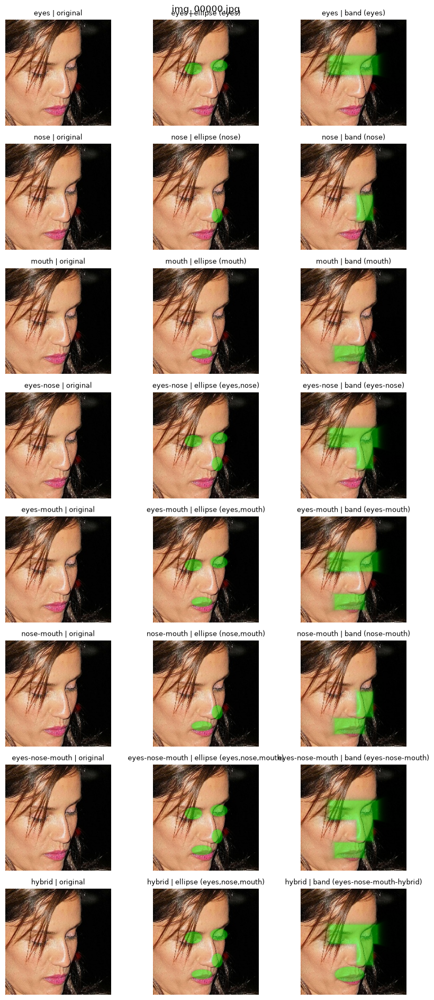

Salvo: /mnt/study-data/dcarvalho/tests/mask_bands_view_3/img_00000_ellipse_vs_band.jpg


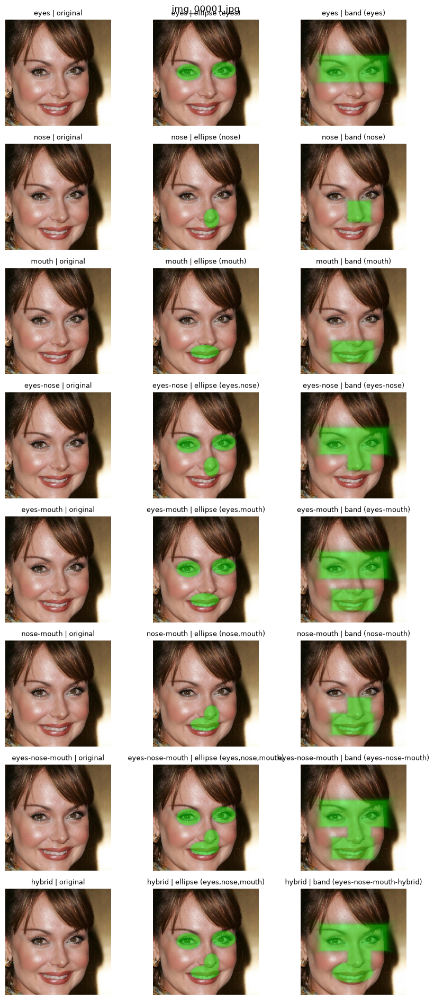

Salvo: /mnt/study-data/dcarvalho/tests/mask_bands_view_3/img_00001_ellipse_vs_band.jpg


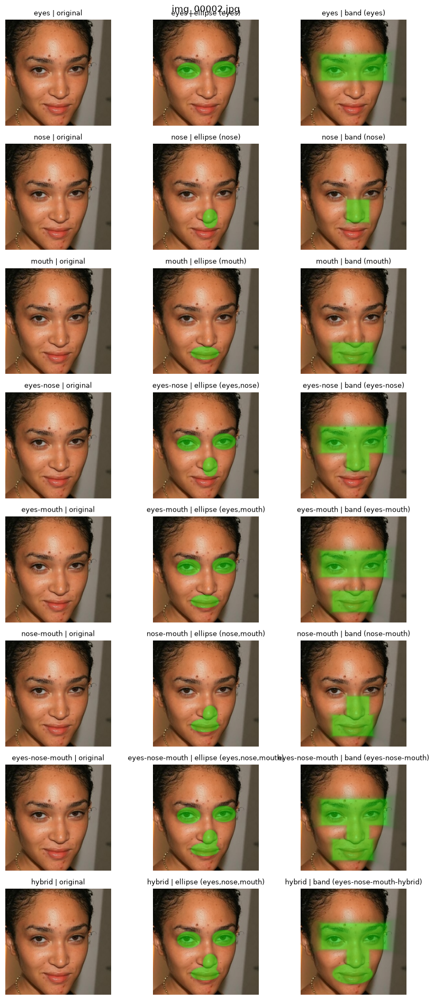

Salvo: /mnt/study-data/dcarvalho/tests/mask_bands_view_3/img_00002_ellipse_vs_band.jpg


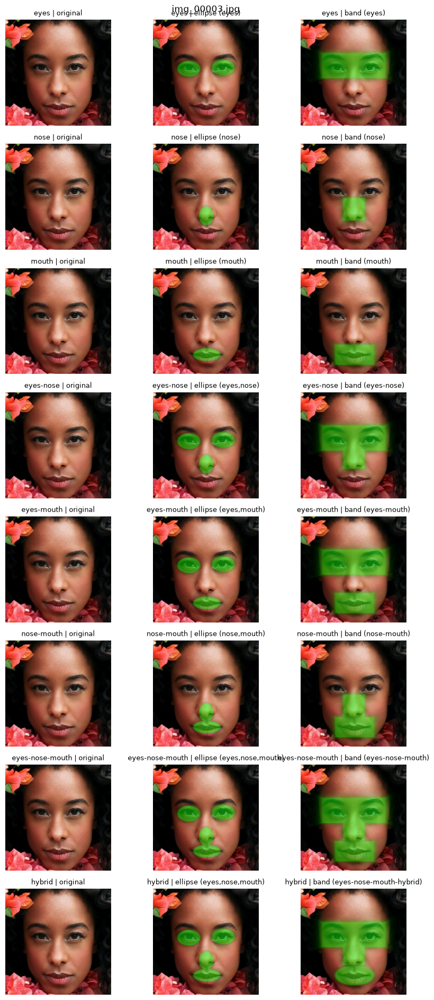

Salvo: /mnt/study-data/dcarvalho/tests/mask_bands_view_3/img_00003_ellipse_vs_band.jpg


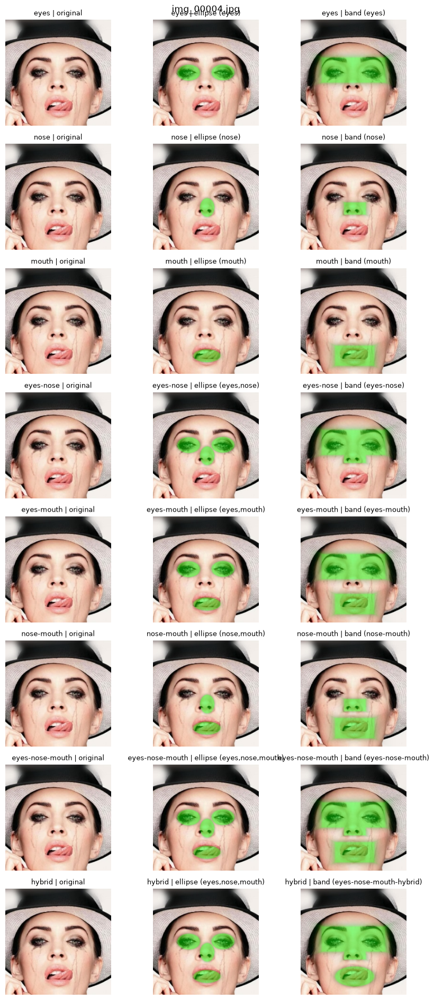

Salvo: /mnt/study-data/dcarvalho/tests/mask_bands_view_3/img_00004_ellipse_vs_band.jpg


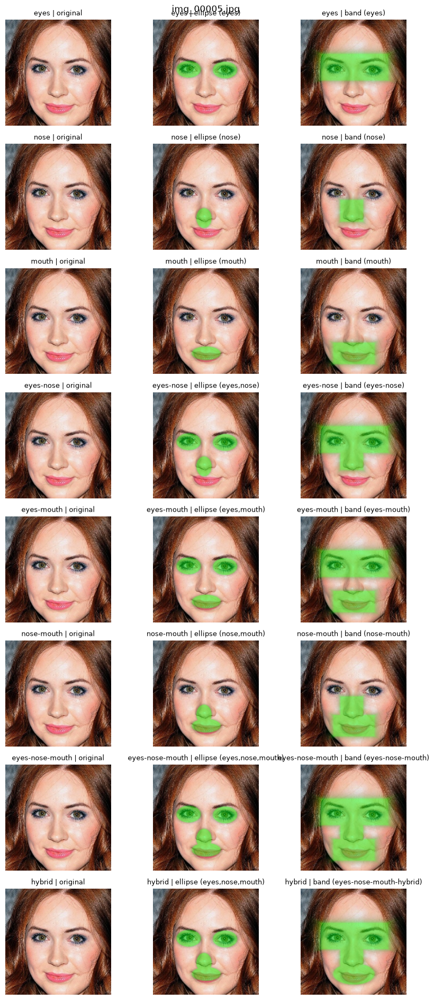

Salvo: /mnt/study-data/dcarvalho/tests/mask_bands_view_3/img_00005_ellipse_vs_band.jpg

Figuras em: /mnt/study-data/dcarvalho/tests/mask_bands_view_3
Checklist: nariz sem boca? eyes-mouth = união? hybrid com elipse na base?


In [14]:
def render_comparison_grid(rgb: np.ndarray, landmarks: np.ndarray, title: str):
    n = len(COMPARISONS)
    fig, axes = plt.subplots(n, 3, figsize=(9, 2.4 * n))
    if n == 1:
        axes = np.array([axes])

    for row, (label, ell_spec, band_spec) in enumerate(COMPARISONS):
        ell = build_region_mask(
            landmarks, parse_mask_regions(ell_spec), IMAGE_SIZE, IMAGE_SIZE, device
        )
        band = build_band_region_mask(
            landmarks, parse_mask_regions(band_spec), IMAGE_SIZE, IMAGE_SIZE, device
        )
        ell_np = mask_tensor_to_numpy(ell)
        band_np = mask_tensor_to_numpy(band)

        panels = [
            (rgb, f"{label} | original"),
            (overlay_mask(rgb, ell_np), f"{label} | ellipse ({ell_spec})"),
            (overlay_mask(rgb, band_np), f"{label} | band ({band_spec})"),
        ]
        for col, (img, lbl) in enumerate(panels):
            axes[row, col].imshow(img)
            axes[row, col].set_title(lbl, fontsize=9)
            axes[row, col].axis("off")

    fig.suptitle(title, fontsize=12)
    fig.tight_layout()
    return fig


for path, rgb, lm in samples:
    fig = render_comparison_grid(rgb, lm, title=path.name)
    out_path = OUTPUT_DIR / f"{path.stem}_ellipse_vs_band.jpg"
    fig.savefig(out_path, dpi=120, bbox_inches="tight")
    plt.show()
    plt.close(fig)
    print(f"Salvo: {out_path}")

print(f"\nFiguras em: {OUTPUT_DIR}")
print("Checklist: nariz sem boca? eyes-mouth = união? hybrid com elipse na base?")